### BIRD CLASSIFICATION 

### Overview/Image Classification
Image classification is the process of categorizing and labeling groups of pixels or vectors within an image based on specific rules. The categorization law can be devised using one or more spectral or textural characteristics. Two general methods of classification are 'supervised' and 'unsupervised'.

The 3 main types of image classification techniques in remote sensing are:

1. Unsupervised image classification
2. Supervised image classification
3. Object-based image analysis

### Overview/Birds
Bird conservation is a field in the science of conservation biology related to threatened birds. Humans have had a profound effect on many bird species. Over one hundred species have gone extinct in historical times, although the most dramatic human-caused extinctions occurred in the Pacific Ocean as humans colonised the islands of Melanesia, Polynesia and Micronesia, during which an estimated 750–1,800 species of birds became extinct. According to Worldwatch Institute, many bird populations are currently declining worldwide with 1,200 species facing extinction in the next century.

We therefore decided to classify six different classes of birds and further develop a model that will predict the six classes of birds.

### Objective
This analysis seeks to aid in the bird conservation efforts by building a model that can identify and classify various spicies of birds. This will help in identifying their habitats so that they can be protected.

### Experimental Design
1. Loading Dataset
2. Data Cleaning
3. Exploratory Data Analysis
4. Preprocessing of the Data
5. Modelling
6. Prediction
7. Conclusion

In [1]:
# Mounting drive on google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#import Tensorflow and other libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout  
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

from fastai.vision import *
from fastai.metrics import error_rate
from fastai.vision.data import ImageDataBunch

import pandas as pd
from pathlib import Path
import time

import cv2
import os

In [3]:
# getting the dataset from our drive
p = Path("/content/drive/MyDrive/birds/train data")  #Only this line is neccessary, the rest are just for the table below
all_files = []
for i in p.rglob('*.*'):
    all_files.append((i.name, i.parent, time.ctime(i.stat().st_ctime)))

columns = ["File_Name", "Parent", "Created"]
df = pd.DataFrame.from_records(all_files, columns=columns)

df.head()

,File_Name,Parent,Created
0,Facts about Parrot for Kids.webp,/content/drive/MyDrive/birds/train data/parrot,Wed Aug 11 18:50:19 2021
1,How a parrot helped Agra cops crack a....jpg,/content/drive/MyDrive/birds/train data/parrot,Wed Aug 11 18:50:48 2021
2,806 Alexandrine Parrot Photos - Free....jpg,/content/drive/MyDrive/birds/train data/parrot,Wed Aug 11 18:49:34 2021
3,Britain_s naturalised parrot now....bin,/content/drive/MyDrive/birds/train data/parrot,Wed Aug 11 18:49:58 2021
4,Do parrots have taste buds_ - BBC....jpg,/content/drive/MyDrive/birds/train data/parrot,Wed Aug 11 18:50:16 2021


In [6]:
# downloading our dataset
import pathlib
data_dir = pathlib.Path(p)
data_dir

PosixPath('/content/drive/MyDrive/birds/train data')

In [7]:
# The total number of images present
image_counts = len(list(data_dir.glob('*/*.jpg')))
print(image_counts)

1137


There are 1137 images in our dataset.

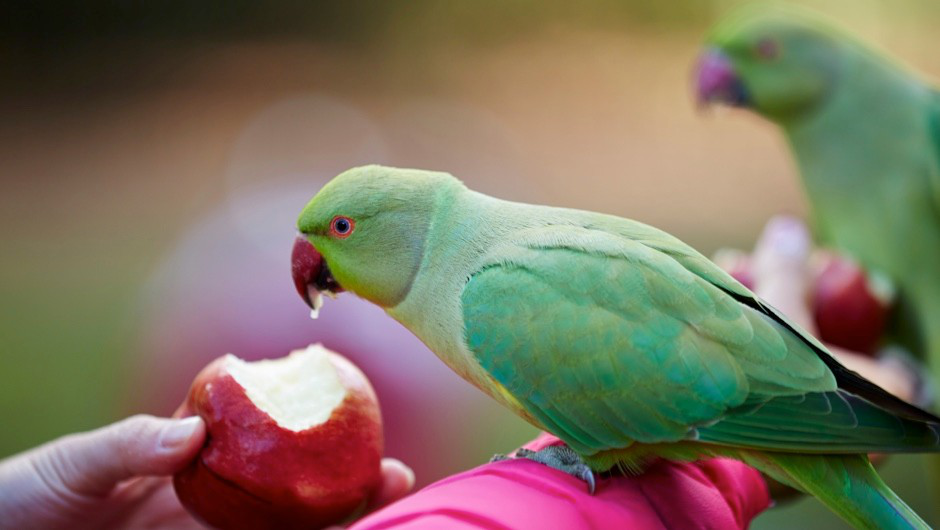

In [8]:
# Previewing the images of a parrot
parrots = list(data_dir.glob('parrot/*'))
PIL.Image.open(str(parrots[4]))

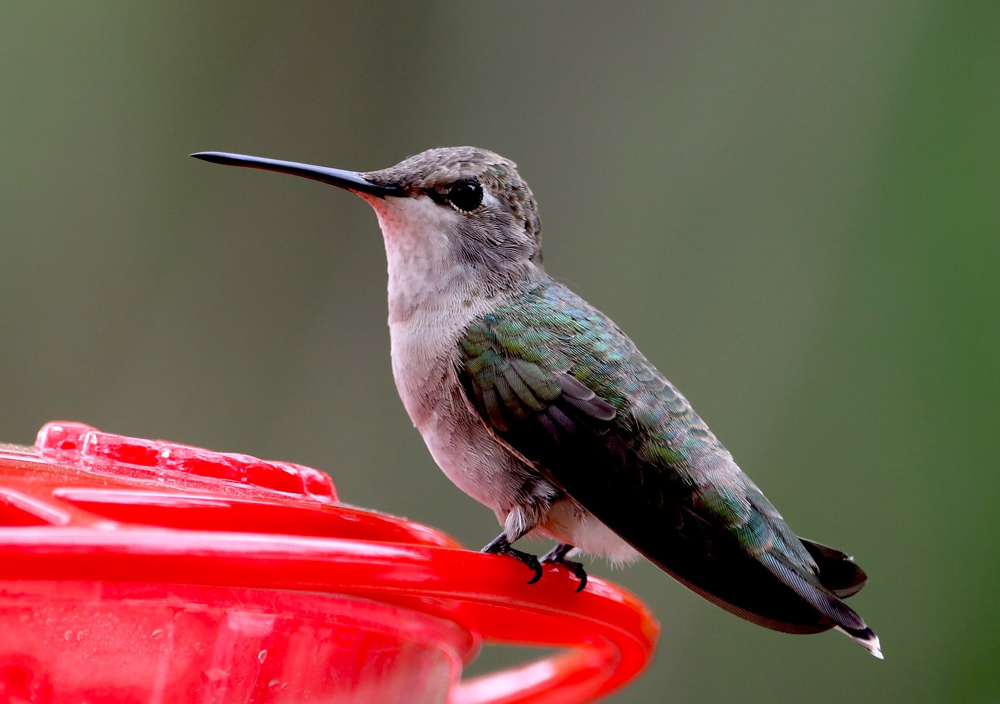

In [9]:
# Previewing the images of a humming bird
humming = list(data_dir.glob('humming_bird/*'))
PIL.Image.open(str(humming[8]))

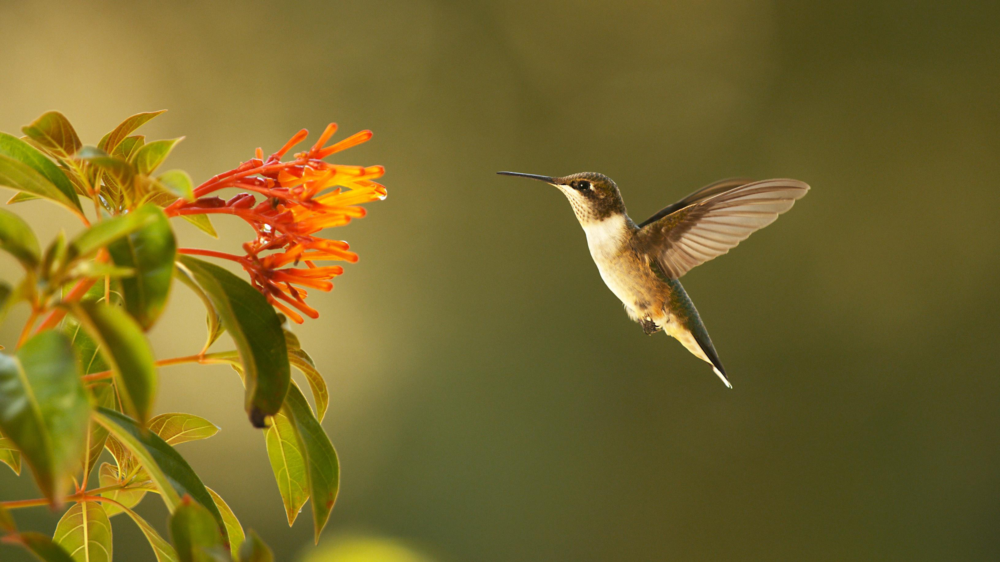

In [10]:
PIL.Image.open(str(humming[2]))

### Exploratory Data Analysis

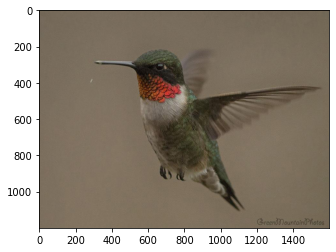

In [11]:
#Preview one of the train images
from keras.preprocessing import image 
import matplotlib.image as mpimg

img = image.load_img('/content/drive/MyDrive/birds/train data/humming_bird/05_04_2021 Hummingbirds_ May Momentum.jpg')
plt.imshow(img)

In [12]:
#shape of train image above
cv2.imread('/content/drive/MyDrive/birds/train data/humming_bird/05_04_2021 Hummingbirds_ May Momentum.jpg').shape

(1200, 1600, 3)

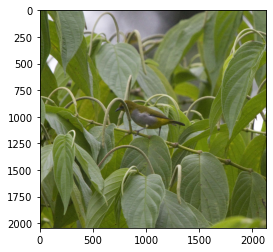

In [15]:
#Preview one of the test images
img_2 = image.load_img('/content/drive/MyDrive/birds/train data/Taita White-eye/AVoCet _ Zosteropidae (1).jpg')
plt.imshow(img_2)

In [17]:
#shape of test image above
cv2.imread('/content/drive/MyDrive/birds/train data/Taita White-eye/AVoCet _ Zosteropidae (1).jpg').shape

(2044, 2131, 3)

## Creating a dataset

In [18]:
# Defining parameters for our loader
# Resizing our images
batch_size = 12
img_height = 180
img_width = 180

In [19]:
# Create the train set by creating a validation split. Let's use 80% for training and 20% for validation.
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1209 files belonging to 6 classes.
Using 968 files for training.


In [20]:
# Create the test set
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1209 files belonging to 6 classes.
Using 241 files for validation.


In [21]:
# Class name attributes on our dataset
class_names = train_ds.class_names
print(class_names)

['Taita White-eye', 'Tiata Thrush', 'falcon', 'humming_bird', 'parrot', 'wood_pecker']


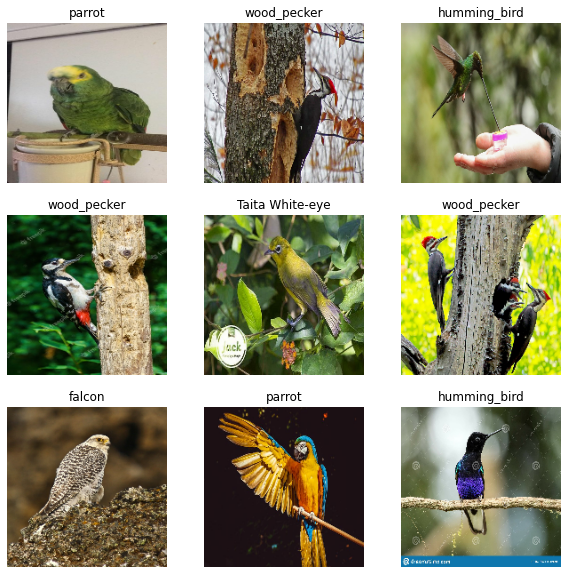

In [22]:
# Preview the images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [23]:
# Iterating over our dataset to retrieve images
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(12, 180, 180, 3)
(12,)


The image_batch is a tensor of the shape (12, 180, 180, 3). This is a batch of 12 images of shape 180x180x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (12,), these are corresponding labels to the 12 images.

## Configure dataset for performance

From here just code testing codes not read...

Dataset.cache() keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.

In [24]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standardize data

The RGB channel values are in the [0, 255] range. This is not ideal for a neural network; in general you should seek to make your input values small. Here, you will standardize values to be in the [0, 1] range by using a Rescaling layer.

In [25]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [31]:
#  using the rescaling layer by apply it to the dataset by calling map:(Turning our data/images into grayscale)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixels values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [26]:
#  using the rescaling layer by apply it to the test dataset by calling map:(Turning our data/images into grayscale)
val_test = val_ds
normalized_ds_test = val_test.map(lambda x, y: (normalization_layer(x), y))
image_batch_test, labels_batch_test = next(iter(normalized_ds_test))
first_image_test = image_batch_test[0]
# Notice the pixels values are now in `[0,1]`.
print(np.min(first_image_test), np.max(first_image_test))

0.026984867 1.0


## Creating a Model

In [ ]:
!pip install wandb

In [ ]:
import wandb

In [ ]:
wandb.login()

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
import math
import random

In [ ]:
# 1. Start a W&B run
wandb.init(project='birds_project')

wandb: Currently logged in as: veronica_isiaho (use `wandb login --relogin` to force relogin)


In [ ]:
# 2. Save model inputs and hyperparameters
config = wandb.config
config.learning_rate = 1

Using  a standard approach. We will tune our model later to see if we can get a better accuracy.

In [27]:
# Model
# Using a relu activation function.
num_classes = 6

model = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [28]:
# Compile the model
# Using Adam optimizer and losses and SparseCategoricalCrossentropy loss function. 
# To view training and validation accuracy for each training epoch, pass the metrics argument.

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [29]:
# Model summary
# Viewing all the layers of the network using the model's summary method:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 64)        0

Train the model

In [32]:
# Training our model
epochs=10
history = model.fit(
  normalized_ds,
  validation_data=normalized_ds_test,
  epochs=epochs
)

Epoch 1/10
81/81 [==============================] - 54s 665ms/step - loss: 1.7573 - accuracy: 0.2304 - val_loss: 1.7177 - val_accuracy: 0.1950
Epoch 2/10
81/81 [==============================] - 30s 367ms/step - loss: 1.7430 - accuracy: 0.2273 - val_loss: 1.7451 - val_accuracy: 0.2199
Epoch 3/10
81/81 [==============================] - 30s 369ms/step - loss: 1.7399 - accuracy: 0.2428 - val_loss: 1.7366 - val_accuracy: 0.1950
Epoch 4/10
81/81 [==============================] - 30s 368ms/step - loss: 1.7400 - accuracy: 0.2273 - val_loss: 1.7426 - val_accuracy: 0.1950
Epoch 5/10
81/81 [==============================] - 30s 366ms/step - loss: 1.7426 - accuracy: 0.2293 - val_loss: 1.7555 - val_accuracy: 0.1950
Epoch 6/10
81/81 [==============================] - 29s 364ms/step - loss: 1.7407 - accuracy: 0.2428 - val_loss: 1.7351 - val_accuracy: 0.2199
Epoch 7/10
81/81 [==============================] - 29s 364ms/step - loss: 1.7453 - accuracy: 0.2397 - val_loss: 1.7363 - val_accuracy: 0.1950

## Visualize training results

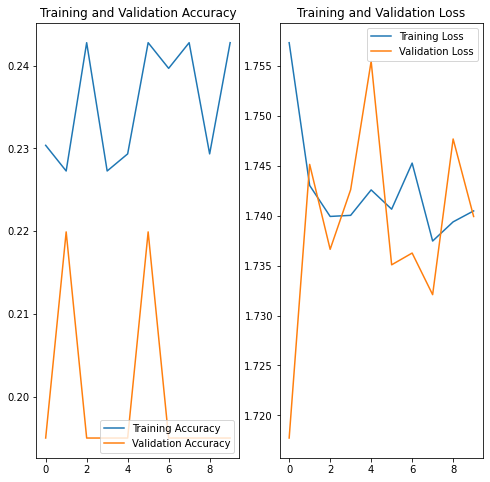

In [33]:
# Creating plots of loss and accuracy on the training and validation sets.
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

From the plots, training accuracy and validation accuracy are off by large margin.

Our model seems to be overfitting. Let's have alook at that.

In [ ]:
# 3. Log metrics over time to visualize performance
for i in range (10):
    wandb.log({"loss": loss})

### Overfitting

The training accuracy is increasing linearly over time. Also, the difference in accuracy between training and validation accuracy is noticeable—a sign of overfitting.

We will use data augmentation and add Dropout to our model to deal with overfitting.

In [ ]:
# Data Augmentation
# Takes the approach of generating additional training data from our existing examples 
# by augmenting them using random transformations that yield believable-looking images. 
# This will help expose the model to more aspects of the data and generalize better.

In [34]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(img_height, 
                                                              img_width,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

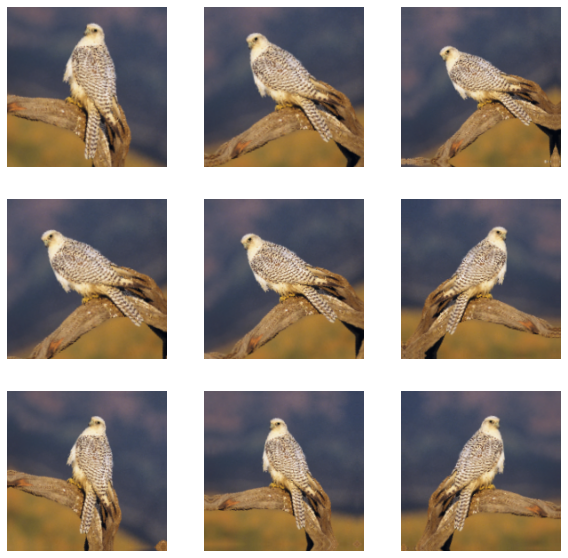

In [35]:
# visualizing what a few augmented examples look like by applying data augmentation to the same image several times:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

### Dropout

When applying Dropout to a layer it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. 

Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

In [36]:
model = Sequential([
  data_augmentation,
  layers.experimental.preprocessing.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

Compile and train the model

In [37]:
# Compile and train the model
model.compile(optimizer='adagrad',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [38]:
# model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 180, 180, 3)       0         
_________________________________________________________________
rescaling_2 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 45, 45, 64)       

In [39]:
# Fitting the model
epochs = 15
history = model.fit(
  normalized_ds,
  validation_data=normalized_ds_test,
  epochs=epochs
)

Epoch 1/15
81/81 [==============================] - 36s 440ms/step - loss: 1.7863 - accuracy: 0.2221 - val_loss: 1.7830 - val_accuracy: 0.2407
Epoch 2/15
81/81 [==============================] - 35s 438ms/step - loss: 1.7744 - accuracy: 0.2376 - val_loss: 1.7725 - val_accuracy: 0.1950
Epoch 3/15
81/81 [==============================] - 36s 443ms/step - loss: 1.7589 - accuracy: 0.2314 - val_loss: 1.7615 - val_accuracy: 0.1950
Epoch 4/15
81/81 [==============================] - 36s 440ms/step - loss: 1.7461 - accuracy: 0.2304 - val_loss: 1.7544 - val_accuracy: 0.1950
Epoch 5/15
81/81 [==============================] - 36s 442ms/step - loss: 1.7392 - accuracy: 0.2428 - val_loss: 1.7493 - val_accuracy: 0.1950
Epoch 6/15
81/81 [==============================] - 36s 441ms/step - loss: 1.7374 - accuracy: 0.2397 - val_loss: 1.7448 - val_accuracy: 0.1950
Epoch 7/15
81/81 [==============================] - 36s 444ms/step - loss: 1.7356 - accuracy: 0.2438 - val_loss: 1.7431 - val_accuracy: 0.1950

**Visualize training results**

After applying data augmentation and Dropout, there is less overfitting than before, and training and validation accuracy are closer aligned.

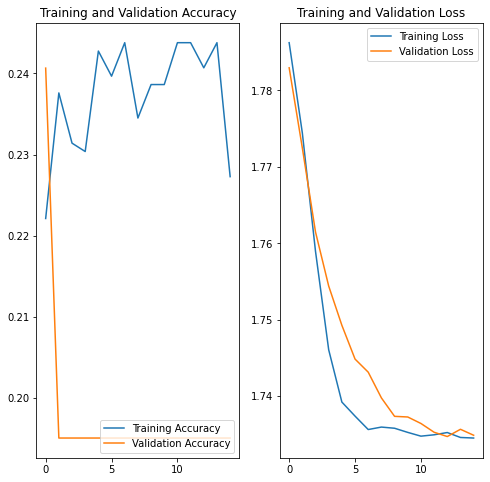

In [40]:
#checking the accuracy/visualization
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

The loss and validation loss has improved however the training and validation accuracy still have a huge difference.

In [ ]:
# 3. Log metrics over time to visualize performance
for i in range (10):
    wandb.log({"loss": loss})

## Tuning our parameters

In [41]:
#Model with data augmentation and dropout
num_classes = 6
model = Sequential([
  data_augmentation,
  layers.experimental.preprocessing.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

#Compiling the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
81/81 [==============================] - 36s 438ms/step - loss: 1.7816 - accuracy: 0.2913 - val_loss: 1.6143 - val_accuracy: 0.3195
Epoch 2/15
81/81 [==============================] - 36s 439ms/step - loss: 1.3947 - accuracy: 0.4576 - val_loss: 1.3105 - val_accuracy: 0.4772
Epoch 3/15
81/81 [==============================] - 35s 438ms/step - loss: 1.2358 - accuracy: 0.5465 - val_loss: 1.2785 - val_accuracy: 0.5145
Epoch 4/15
81/81 [==============================] - 35s 436ms/step - loss: 1.1372 - accuracy: 0.5857 - val_loss: 1.2224 - val_accuracy: 0.5685
Epoch 5/15
81/81 [==============================] - 35s 437ms/step - loss: 1.0863 - accuracy: 0.6054 - val_loss: 1.2152 - val_accuracy: 0.5477
Epoch 6/15
81/81 [==============================] - 35s 438ms/step - loss: 0.9539 - accuracy: 0.6694 - val_loss: 1.2956 - val_accuracy: 0.5975
Epoch 7/15
81/81 [==============================] - 35s 437ms/step - loss: 0.9213 - accuracy: 0.6715 - val_loss: 1.3997 - val_accuracy: 0.5270

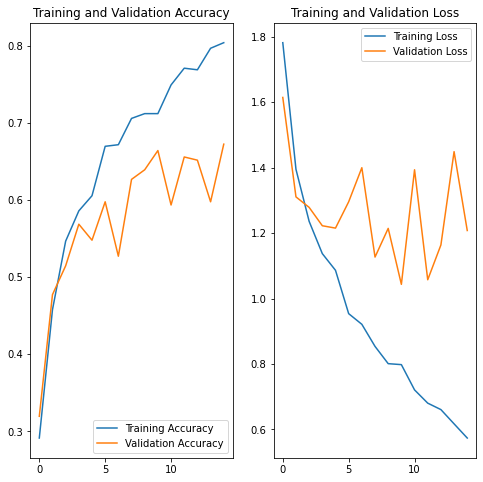

In [50]:
#Create plots of loss and accuracy on the training and validation sets

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


This is the best performing model with augmentation and dropout.

The best accuracy obtained was 67.22%.

There is a lot of flactuation in the loss and accuracy graphs.

## Predicting the test dataset

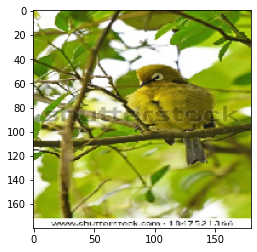

In [74]:
#   Predicting
from tensorflow.keras.preprocessing import image
y = '/content/drive/MyDrive/birds/test data/Taita White-eye/Shutterstock - PuzzlePix (1).jpg'
img = image.load_img(y,target_size=(180,180))
plt.imshow(img)
plt.show()

In [73]:
# Predicting taita image
Taita = '/content/drive/MyDrive/birds/test data/Taita White-eye/Shutterstock - PuzzlePix (1).jpg'

img = keras.preprocessing.image.load_img(
    Taita, target_size=(img_height, img_width)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to Tiata Thrush with a 50.02 percent confidence.


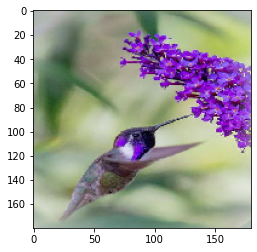

In [69]:
#   Predicting
from tensorflow.keras.preprocessing import image
y = '/content/drive/MyDrive/birds/test data/humming_bird/Colorful birds.jpg'
img = image.load_img(y,target_size=(180,180))
plt.imshow(img)
plt.show()

In [70]:
#predicting humming bird image
humming_bird = y

img = keras.preprocessing.image.load_img(
    humming_bird, target_size=(img_height, img_width)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to humming_bird with a 100.00 percent confidence.


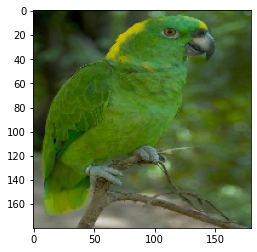

In [71]:
#   Predicting
from tensorflow.keras.preprocessing import image
y = '/content/drive/MyDrive/birds/test data/parrot/Yellow-Naped Amazon Parrots For Sale....jpg'
img = image.load_img(y,target_size=(180,180))
plt.imshow(img)
plt.show()

In [72]:
# predicting parrot image
parrot = y

img = keras.preprocessing.image.load_img(
    parrot, target_size=(img_height, img_width)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to parrot with a 98.46 percent confidence.


## Conclusion

- Introducing dropout and augmentation reduced overfitting and gave us our best performing model with an accuracy of 67.22%. However there was still alot of overfitting present in the model.

- The model was able to accurately predict birds with distinct features but it couldn't differentiate between familiar specied ie. Taita White-eye and Taita thrush birds.